In [1]:
%load_ext autoreload

import os, sys
sys.path.insert(0, "../")
sys.path.insert(1, '/home/j/joppich/.local/lib/python3.11/site-packages')
print(sys.path)

%autoreload 2
from flowset import *

os.environ["POLARS_MAX_THREADS"] = "8"
import polars as pl

# for downloading pathways
import urllib, zipfile

# plotting
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300


['../', '/home/j/joppich/.local/lib/python3.11/site-packages', '/mnt/raidbio/extproj/projekte/FlowSets/examples', '', '/mnt/biosoft/software/python/3.11/lib/python3.11/site-packages', '/mnt/biosoft/software/python/3.11/lib64/python3.11/site-packages', '/usr/lib64/python311.zip', '/usr/lib64/python3.11', '/usr/lib64/python3.11/lib-dynload', '/home/j/joppich/.local/lib/python3.11/site-packages', '/usr/lib64/python3.11/site-packages', '/usr/lib64/python3.11/_import_failed', '/usr/lib/python3.11/site-packages']


In [2]:
def download_and_unzip(download_url_link, dir_path, zipped_filename,destination_dir_name):
    #https://www.tutorialsbuddy.com/download-and-unzip-a-zipped-file-in-python
    print("Download starting")
    urllib.request.urlretrieve(
        download_url_link, os.path.join(dir_path, zipped_filename)
    )
    print("Download complete")

    print("unzipping file starting")
    with zipfile.ZipFile(os.path.join(dir_path, zipped_filename), "r") as zip_file:
        zip_file.extractall(os.path.join(dir_path, destination_dir_name))
    print("unzipping complete")
    print("Removing zipped file")
    os.remove(zipped_filename)


if not os.path.exists("ReactomePathways.gmt"):
    download_and_unzip("https://reactome.org/download/current/ReactomePathways.gmt.zip", ".", "ReactomePathways.gmt.zip", ".")

In [3]:
exprData = pl.read_csv("all_tcga_foldchanges.tsv", has_header=True, separator="\t", null_values=["NA"], n_threads=8)
exprData = exprData.filter( pl.col("p_val_adj") < 0.05)
print(exprData)

shape: (72_843, 25)
┌──────────┬────────────┬────────────┬───────┬───┬───────────┬────────────┬───────────────┬────────┐
│ gene     ┆ p_val      ┆ avg_log2FC ┆ pct.1 ┆ … ┆ anum.norm ┆ log2fc_dis ┆ log2fc_dist_s ┆ cancer │
│ ---      ┆ ---        ┆ ---        ┆ ---   ┆   ┆ al        ┆ t_var      ┆ d             ┆ ---    │
│ str      ┆ f64        ┆ f64        ┆ f64   ┆   ┆ ---       ┆ ---        ┆ ---           ┆ str    │
│          ┆            ┆            ┆       ┆   ┆ i64       ┆ f64        ┆ f64           ┆        │
╞══════════╪════════════╪════════════╪═══════╪═══╪═══════════╪════════════╪═══════════════╪════════╡
│ AARD     ┆ 1.9122e-12 ┆ -0.749786  ┆ 0.845 ┆ … ┆ 19        ┆ 0.96094    ┆ 0.980276      ┆ BLCA   │
│ ABCA8    ┆ 1.5182e-15 ┆ -0.59633   ┆ 0.998 ┆ … ┆ 19        ┆ 0.122342   ┆ 0.349774      ┆ BLCA   │
│ ABCA9    ┆ 5.3055e-7  ┆ -0.350153  ┆ 1.0   ┆ … ┆ 19        ┆ 0.170653   ┆ 0.413101      ┆ BLCA   │
│ ABCB1    ┆ 1.2739e-9  ┆ -0.261125  ┆ 1.0   ┆ … ┆ 19        ┆ 0.042178

(array([1.000e+00, 1.000e+00, 0.000e+00, 1.000e+00, 2.000e+00, 3.000e+00,
        1.000e+00, 2.000e+00, 8.000e+00, 4.000e+00, 4.000e+00, 7.000e+00,
        5.000e+00, 8.000e+00, 1.500e+01, 1.000e+01, 1.500e+01, 9.000e+00,
        1.500e+01, 1.900e+01, 1.700e+01, 2.800e+01, 2.600e+01, 2.500e+01,
        3.600e+01, 3.900e+01, 3.900e+01, 3.800e+01, 3.400e+01, 4.700e+01,
        4.900e+01, 4.600e+01, 6.600e+01, 6.700e+01, 6.500e+01, 7.400e+01,
        9.100e+01, 8.400e+01, 9.200e+01, 1.100e+02, 1.230e+02, 1.250e+02,
        1.270e+02, 1.490e+02, 1.540e+02, 1.970e+02, 1.770e+02, 1.740e+02,
        1.920e+02, 2.390e+02, 2.610e+02, 2.660e+02, 2.510e+02, 2.950e+02,
        2.860e+02, 3.500e+02, 3.660e+02, 3.550e+02, 3.860e+02, 3.920e+02,
        4.600e+02, 4.700e+02, 5.490e+02, 5.530e+02, 6.170e+02, 6.340e+02,
        6.670e+02, 6.880e+02, 7.270e+02, 7.830e+02, 8.400e+02, 9.160e+02,
        9.430e+02, 8.920e+02, 1.015e+03, 1.038e+03, 1.145e+03, 1.083e+03,
        1.215e+03, 1.174e+03, 1.362e+0

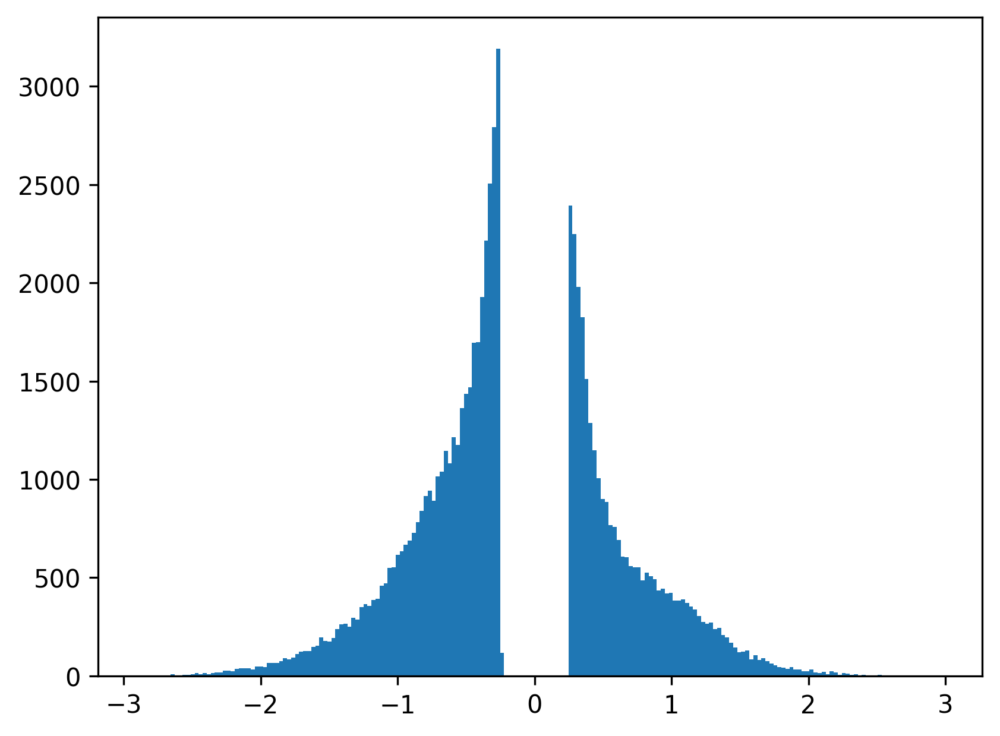

In [62]:
plt.hist(exprData["avg_log2FC"], bins=200)

In [4]:
exprData.filter(pl.col("gene") == "IFI44L")

gene,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,num.cancer,min.cancer,lower_hinge.cancer,median.cancer,upper_hinge.cancer,max.cancer,mean.cancer,anum.cancer,num.normal,min.normal,lower_hinge.normal,median.normal,upper_hinge.normal,max.normal,mean.normal,anum.normal,log2fc_dist_var,log2fc_dist_sd,cancer
str,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64,f64,i64,i64,f64,f64,f64,f64,f64,f64,i64,f64,f64,str
"""IFI44L""",2.0296e-11,0.261224,1.0,1.0,0.000001,502,2.397895,7.784473,8.747273,9.706134,11.364901,8.600934,502,44,4.812184,6.165416,7.070195,7.758108,9.325186,7.010826,44,0.062344,0.249689,"""HNSC"""
"""IFI44L""",6.0017e-11,-0.297429,1.0,1.0,0.000003,66,4.615121,5.7301,6.578527,7.315218,8.637462,6.537433,66,25,7.024649,7.705262,8.084562,8.702178,10.058138,8.263145,25,0.037783,0.194378,"""KICH"""


In [5]:
allCancers = sorted(set(exprData["cancer"]))
allCancers

['BLCA',
 'BRCA',
 'COAD',
 'ESCA',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

In [6]:
pl.__version__

'0.18.4'

{'seriesOrder': ['BLCA', 'BRCA', 'COAD', 'ESCA', 'HNSC', 'KICH', 'KIRC', 'KIRP', 'LIHC', 'LUAD', 'LUSC', 'PRAD', 'READ', 'STAD', 'THCA', 'UCEC']}
-4.0 4.0
centers [-2, -1, 0, 1, 2]
Creating Universe Range -4.0 -> 4.0 with step size 0.1
Mean Expr avg_log2FC col 2
Expr Count pct.1 col 3
SD None col None
Cluster cancer col 24
Combining over state:  False


/mnt/raidbio/extproj/projekte/FlowSets/examples/../flowset.py:650: RuntimeWarning: invalid value encountered in divide
  values = fuzz.trimf(self.universe, abc)/unscaledValues


to_homogeneous: BRCA
to_homogeneous: STAD
to_homogeneous: KIRP
to_homogeneous: KICH
to_homogeneous: ESCA
to_homogeneous: BLCA
to_homogeneous: READ
to_homogeneous: THCA
to_homogeneous: UCEC
to_homogeneous: LIHC
to_homogeneous: LUAD
to_homogeneous: LUSC
to_homogeneous: KIRC
to_homogeneous: COAD
to_homogeneous: PRAD
to_homogeneous: HNSC


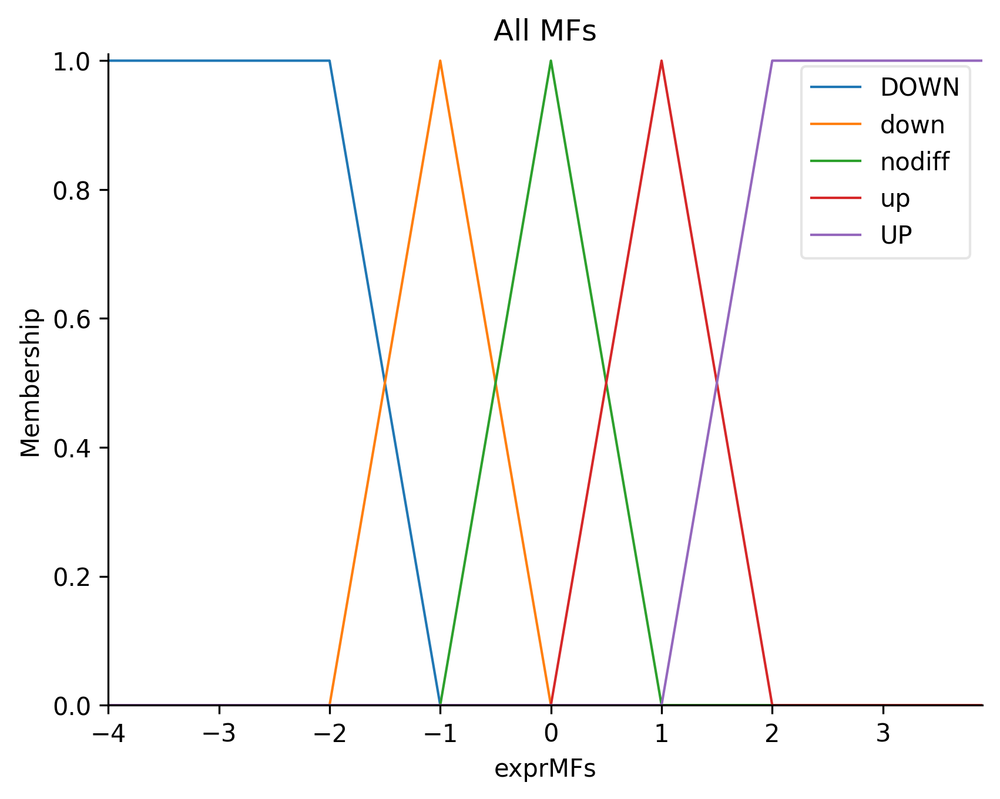

In [56]:
explDFRaw, mfFuzzy = FlowAnalysis.fuzzify_exprvalues(exprData, stepsize=0.1, seriesOrder=allCancers, mfLevels = ["DOWN", "down", "nodiff", "up", "UP"], centers=[-2, -1, 0 , 1, 2], meancolName="avg_log2FC", sdcolName=None, exprcolName="pct.1", mfLevelsMirrored=True, clusterColName="cancer") #"cluster.thrombus"


In [57]:
explDFRaw.head()

gene,BRCA,STAD,KIRP,KICH,ESCA,BLCA,READ,THCA,UCEC,LIHC,LUAD,LUSC,KIRC,COAD,PRAD,HNSC
str,list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64],list[f64]
"""A2MP1""","[0.0, 0.255412, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 0.327783, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 0.28287, … 0.0]","[0.0, 0.250174, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]"
"""A4GNT""","[0.0, 0.269111, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.248833, 0.175167, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 0.342581, … 0.0]","[0.0, 0.353226, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 1.2541e-15, … 0.0]"
"""AADAC""","[0.0, 0.579978, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.041186, 0.386814, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 0.407195, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 0.352377, … 0.0]"
"""AADACL2""","[0.0, 0.527326, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.168363, 0.298637, … 0.0]","[0.024733, 0.357267, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 2.8066e-16, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.137313, 0.312687, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]"
"""AADACL2.AS1""","[0.0, 0.302241, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.073877, 0.225123, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]","[0.0, 3.5527e-15, … 0.0]"


In [58]:
explDFWide = FlowAnalysis.to_vwide(explDFRaw, mfFuzzy)
explDFWide.head()

gene,DOWN.BRCA,UP.BRCA,down.BRCA,nodiff.BRCA,up.BRCA,DOWN.STAD,UP.STAD,down.STAD,nodiff.STAD,up.STAD,DOWN.KIRP,UP.KIRP,down.KIRP,nodiff.KIRP,up.KIRP,DOWN.KICH,UP.KICH,down.KICH,nodiff.KICH,up.KICH,DOWN.ESCA,UP.ESCA,down.ESCA,nodiff.ESCA,up.ESCA,DOWN.BLCA,UP.BLCA,down.BLCA,nodiff.BLCA,up.BLCA,DOWN.READ,UP.READ,down.READ,nodiff.READ,up.READ,DOWN.THCA,…,nodiff.UCEC,up.UCEC,DOWN.LIHC,UP.LIHC,down.LIHC,nodiff.LIHC,up.LIHC,DOWN.LUAD,UP.LUAD,down.LUAD,nodiff.LUAD,up.LUAD,DOWN.LUSC,UP.LUSC,down.LUSC,nodiff.LUSC,up.LUSC,DOWN.KIRC,UP.KIRC,down.KIRC,nodiff.KIRC,up.KIRC,DOWN.COAD,UP.COAD,down.COAD,nodiff.COAD,up.COAD,DOWN.PRAD,UP.PRAD,down.PRAD,nodiff.PRAD,up.PRAD,DOWN.HNSC,UP.HNSC,down.HNSC,nodiff.HNSC,up.HNSC
str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""A2MP1""",0.0,0.0,0.255412,0.744588,0.0,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,0.327783,0.672217,0.0,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,…,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,0.28287,0.71713,0.0,0.0,0.0,0.250174,0.749826,0.0,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15
"""A4GNT""",0.0,0.0,0.269111,0.730889,8.8107e-16,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.248833,0.0,0.175167,0.576,2.0464e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,…,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,0.342581,0.657419,5.5778e-16,0.0,0.0,0.353226,0.646774,6.8923e-16,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,1.2541e-15,0.468905,0.531095
"""AADAC""",0.0,0.0,0.579978,0.420022,1.1262e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.041186,…,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,0.407195,0.592805,1.1013e-16,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,0.352377,0.647623,2.4158e-16
"""AADACL2""",0.0,0.0,0.527326,0.472674,1.4282e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.168363,0.0,0.298637,0.533,1.8936e-15,0.024733,…,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,2.8066e-16,0.551728,0.448272,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.137313,0.0,0.312687,0.55,1.9540e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15
"""AADACL2.AS1""",0.0,0.0,0.302241,0.697759,7.9581e-16,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.073877,…,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15,0.0,0.0,3.5527e-15,1.0,3.5527e-15


In [59]:
fa = FlowAnalysis(explDFWide, "gene", [(x, x) for x in sorted(allCancers)], mfFuzzy) #("thrombus", "Thrombus"),

In [66]:
fa.plot_coarse_flows(transformCounts=lambda x: np.sqrt(x))

In [67]:
isgListLong = ("MX1","MX2","MT2A","RSAD2","SIGLEC1","IFIT1","IFI44","IFI27","IFITM10","IFIT3","IFI6","IFIT1P1","IFIT2","IFITM9P","IFI30","IFITM3","IFI44L","IFIT1B","IFITM5","IFITM3P2","IFITM3P9","IFI27L2","IFIT5","IFITM1","IFIH1","IFI16","IFI35","IFI27L1","IRF6","IRF7","IRF9","IRF5","IRF4","IRF2BP2","IRF2BPL","IRF3","IRF1-AS1","ISG15","ISG20L2","ISG20","XAF1","LY6E","IFITM2","IFITM3P6","IFITM3P3","IFIT6P","IRF2BP1","IRF5P1","IRF2","IRF1","IRF8","IFITM3P7","IFITM4P","IFITM3P1","IFITM3P8")
isgListShort = ("MT2A", "ISG15", "LY6E", "IFIT1", "IFIT2", "IFIT3", "IFITM1", "IFITM3", "IFI44L", "IFI6", "MX1", "IFI27",  "IFI44L", "RSAD2", "SIGLEC1", "IFIT1", "ISG15")

shape: (7, 81)
┌─────────┬───────────┬─────────┬────────────┬───┬─────────┬────────────┬─────────────┬────────────┐
│ gene    ┆ DOWN.BRCA ┆ UP.BRCA ┆ down.BRCA  ┆ … ┆ UP.HNSC ┆ down.HNSC  ┆ nodiff.HNSC ┆ up.HNSC    │
│ ---     ┆ ---       ┆ ---     ┆ ---        ┆   ┆ ---     ┆ ---        ┆ ---         ┆ ---        │
│ str     ┆ f64       ┆ f64     ┆ f64        ┆   ┆ f64     ┆ f64        ┆ f64         ┆ f64        │
╞═════════╪═══════════╪═════════╪════════════╪═══╪═════════╪════════════╪═════════════╪════════════╡
│ IFI44L  ┆ 0.0       ┆ 0.0     ┆ 3.5527e-15 ┆ … ┆ 0.0     ┆ 0.0        ┆ 0.738776    ┆ 0.261224   │
│ IFIT1   ┆ 0.0       ┆ 0.0     ┆ 3.5527e-15 ┆ … ┆ 0.0     ┆ 3.5527e-15 ┆ 1.0         ┆ 3.5527e-15 │
│ LY6E    ┆ 0.0       ┆ 0.0     ┆ 3.5527e-15 ┆ … ┆ 0.0     ┆ 3.5527e-15 ┆ 1.0         ┆ 3.5527e-15 │
│ RSAD2   ┆ 0.0       ┆ 0.0     ┆ 3.5527e-15 ┆ … ┆ 0.0     ┆ 0.0        ┆ 0.70642     ┆ 0.29358    │
│ ISG15   ┆ 0.0       ┆ 0.0     ┆ 3.5527e-15 ┆ … ┆ 0.0     ┆ 0.0        ┆ 0.

<Figure size 1800x1800 with 0 Axes>

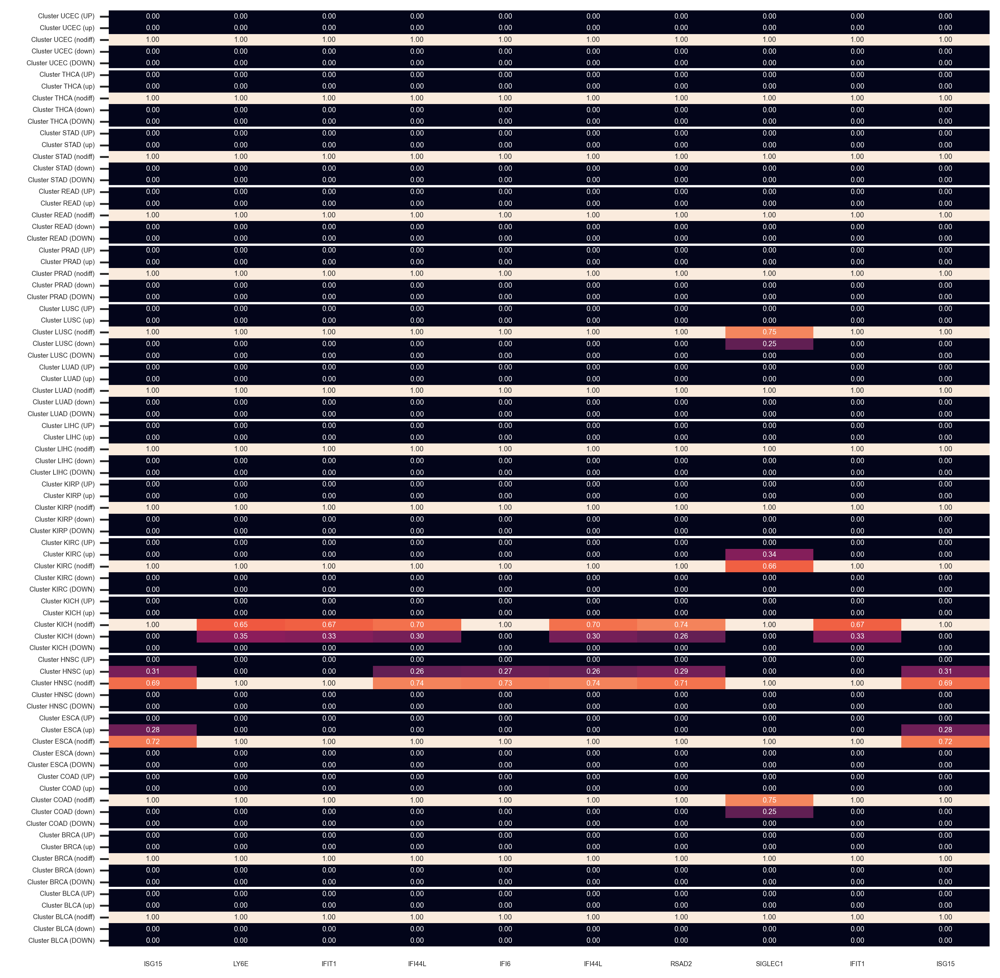

In [74]:
_=fa.plot_state_memberships(isgListShort, verbose=False)

In [ ]:
cancer2idx = {x: i for i,x in enumerate(allCancers)}

In [ ]:
set(allCancers)

In [77]:
relations = ["=" for x in allCancers[1:]]
maxLevels = ["nodiff" for x in allCancers]
minLevels = ["nodiff" for x in allCancers]

In [ ]:
minLevels[cancer2idx["LUAD"]] = None
maxLevels[cancer2idx["LUAD"]] = None

minLevels[cancer2idx["LUSC"]] = None
maxLevels[cancer2idx["LUSC"]] = None


In [ ]:
targetFlows = fa.flow_finder(relations, minLevels=minLevels, maxLevels=maxLevels, verbose=True)
print(targetFlows)

Creating FlowIDs
